## Don't Overfit! II
This Case Study is based on one of the Kaggle competition problems
named “Don’t Overfit!!”. It emphasizes the most necessary step in the
building of models, that is to ensure that the model does not overfit
the training data and leads to good predictions on new unseen data.
<br><br><b>Business Problem:</b>
The problem is to find a model that generalizes well, seems simple but
the catch here is that we have to find it from the extremely small
training samples and should work on the unseen testing samples
without overfitting. The main objective of this problem is to use the
existing research, algorithms, techniques or strategies that can be
used to prevent the model from overfitting to the training dataset.
These techniques or strategies will be used in the area of Feature
Engineering, Feature Selection, Oversampling dataset.
The purpose of this case study is to solve the given problem by using
the leverage that the feature engineering and feature selection will
bring to the model and to show how a well-engineered feature will
allow us to use a less complex model and thereby avoid overfit.
1. Problem type : Binary Classification
2. Performance Metric : AUCROC (Kaggle will evaluate
using AUCROC)
3. No. of Train data point : 250 Data Points
4. No. of Test data point : 19,750 Data Points
5. No. of Features : 300 Features

## Exploratory Data Analysis(EDA)

### Importing Libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statistics
import scipy.stats as stats
import numpy as np
from sklearn.manifold import TSNE
from sklearn import decomposition
import warnings
warnings.filterwarnings('ignore')
sns.set_style("darkgrid")

### Importing Data

In [2]:
df = pd.read_csv('dont-overfit-ii/train.csv')
print('Shape Of Dataset: ', df.shape)
df.head()

Shape Of Dataset:  (250, 302)


,id,target,0,1,2,3,4,5,6,7,...,290,291,292,293,294,295,296,297,298,299
0,0,1.0,-0.098,2.165,0.681,-0.614,1.309,-0.455,-0.236,0.276,...,0.867,1.347,0.504,-0.649,0.672,-2.097,1.051,-0.414,1.038,-1.065
1,1,0.0,1.081,-0.973,-0.383,0.326,-0.428,0.317,1.172,0.352,...,-0.165,-1.695,-1.257,1.359,-0.808,-1.624,-0.458,-1.099,-0.936,0.973
2,2,1.0,-0.523,-0.089,-0.348,0.148,-0.022,0.404,-0.023,-0.172,...,0.013,0.263,-1.222,0.726,1.444,-1.165,-1.544,0.004,0.800,-1.211
3,3,1.0,0.067,-0.021,0.392,-1.637,-0.446,-0.725,-1.035,0.834,...,-0.404,0.640,-0.595,-0.966,0.900,0.467,-0.562,-0.254,-0.533,0.238
4,4,1.0,2.347,-0.831,0.511,-0.021,1.225,1.594,0.585,1.509,...,0.898,0.134,2.415,-0.996,-1.006,1.378,1.246,1.478,0.428,0.253


Observations:
- We have 250 Observation in the train data and 300 independent features(Excluding Id)
- The Target Variable has Binary Values.

### Distribution of the Target Variable

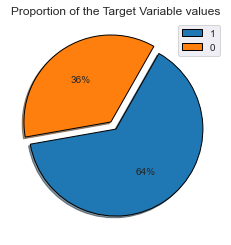

In [5]:
plt.pie(df['target'].value_counts(), startangle=190,
        wedgeprops={'edgecolor': 'black'}, autopct='%1.f%%', explode = (0, 0.1),  shadow=True)
plt.legend(loc='upper right', labels=[1,0], fontsize='medium')
plt.title('Proportion of the Target Variable values')
plt.show()

Observations:
- Since we have only two unique values in the target variable.This is a Binary classification
- We can see that there is a imbalance between the two class. This imbalance data will affect our model's ability to learn and needs to be taken care of.

### Performance Metrics:
- The Accuracy cannot be used as the data is imbalanced.
- F1 score, AUROC, Precision, Recall can be used.
- Since the Kaggle will evaluate based on the AUROC, we will also be using that metric.
        

### Description of Data

In [4]:
def describe_data(data):
    '''
    Method to provide more additional description like median, skewness , krutosis,..etc of the columns of the dataframe
    Parameter    : data - The Input dataframe for which the description is needed
    Return Value : desc - The dataframe that contains the information about the given Independent variables of the given dataframe
    '''
    percent = [.25, .5, .75, 0.95, 0.99]
    desc = data.describe(percentiles = percent).drop(['id', 'target'], axis = 1)
    desc.loc['median'] = data.apply(statistics.median,axis = 0).iloc[2:]
    desc.loc['skewness'] = data.apply(stats.skew,axis = 0).iloc[2:]
    desc.loc['kurtosis'] = data.apply(stats.kurtosis,axis = 0).iloc[2:]
    desc.loc['normal_hyp_pval'] = df.apply(lambda x: stats.kstest(x, 'norm'),axis = 0).loc[1,'0':]
    desc.loc['data_type'] = df.dtypes.iloc[2:]
    return desc

In [5]:
#creating a seperate dataframe for each of the class to analyse them more
df_0 = df[df['target'] == 0]
df_1 = df[df['target'] == 1]

#finding the description about the dataframes
desc = describe_data(df)
desc_0 = describe_data(df_0)
desc_1 = describe_data(df_1)
desc

,0,1,2,3,4,5,6,7,8,9,...,290,291,292,293,294,295,296,297,298,299
count,250,250,250,250,250,250,250,250,250,250,...,250,250,250,250,250,250,250,250,250,250
mean,0.023292,-0.026872,0.167404,0.001904,0.001588,-0.007304,0.032052,0.078412,-0.03692,0.035448,...,0.044652,0.126344,0.018436,-0.012092,-0.06572,-0.106112,0.046472,0.006452,0.009372,-0.128952
std,0.998354,1.00931,1.02171,1.01175,1.03541,0.9557,1.00666,0.939731,0.963688,1.01969,...,1.01142,0.972567,0.954229,0.96063,1.05741,1.03839,0.967661,0.998984,1.0081,0.971219
min,-2.319,-2.931,-2.477,-2.359,-2.566,-2.845,-2.976,-3.444,-2.768,-2.361,...,-2.804,-2.443,-2.757,-2.466,-3.287,-3.072,-2.634,-2.776,-3.211,-3.5
25%,-0.64475,-0.73975,-0.42525,-0.6865,-0.659,-0.64375,-0.675,-0.55075,-0.6895,-0.6435,...,-0.617,-0.5105,-0.53575,-0.657,-0.8185,-0.821,-0.6055,-0.75125,-0.55,-0.75425
50%,-0.0155,0.057,0.184,-0.0165,-0.023,0.0375,0.0605,0.1835,-0.0125,0.052,...,0.0675,0.091,0.0575,-0.021,-0.009,-0.0795,0.0095,0.0055,-0.009,-0.1325
75%,0.677,0.62075,0.805,0.72,0.735,0.6605,0.78325,0.76625,0.635,0.733,...,0.79725,0.80425,0.6315,0.65025,0.7395,0.493,0.683,0.79425,0.65425,0.50325
95%,1.75785,1.6213,1.87535,1.58915,1.71305,1.44625,1.6986,1.4856,1.28305,1.63795,...,1.66385,1.7234,1.50675,1.47075,1.6037,1.49465,1.6365,1.5632,1.7148,1.4562
99%,2.27149,2.16602,2.35401,2.26589,2.34701,2.316,2.07661,1.82829,2.13183,2.13479,...,2.3137,2.34082,2.27339,2.27106,2.07544,2.37983,2.33204,2.08146,2.39051,2.26174
max,2.567,2.419,3.392,2.771,2.901,2.793,2.546,2.846,2.512,2.959,...,2.865,2.801,2.736,2.596,2.226,3.131,3.236,2.626,3.53,2.771


### Checking the datatype of all the Features

In [6]:
desc.loc['data_type'].value_counts()

float64    300
Name: data_type, dtype: int64

Observations:
- All the 300 Features is of type Float

### Checking If Any Of The Values Are NULL

In [7]:
#df.isnull() returns true if the value is null for every value
#any() return if false if all the values in the column is false 
#(first any will return for each col, second one returns based on result of series created by first any() method)
df.isnull().any().any() 

False

Observations:
- There are no Null value/Missing value in the Dataset

### Probability Density Function Of All Features

In [8]:
plt.figure(figsize=(100,200))
for col in df_0.columns[2:]:
    plt.subplot(25,12,int(col)+1)
    sns.distplot(df_0[col], label = 'Label_0 ', color='blue')
    sns.distplot(df_1[col], label = 'Label_1', color='orange')
plt.tight_layout()
plt.show()

Observations:
- From the PDF of all the Feature we can see there are a lot of overlap of data points between both the classes and there appears to be no clear seperation.
- Most of the feature look like a Gaussian distribution.

### Checking If The Features Are Gaussian Using KSTest

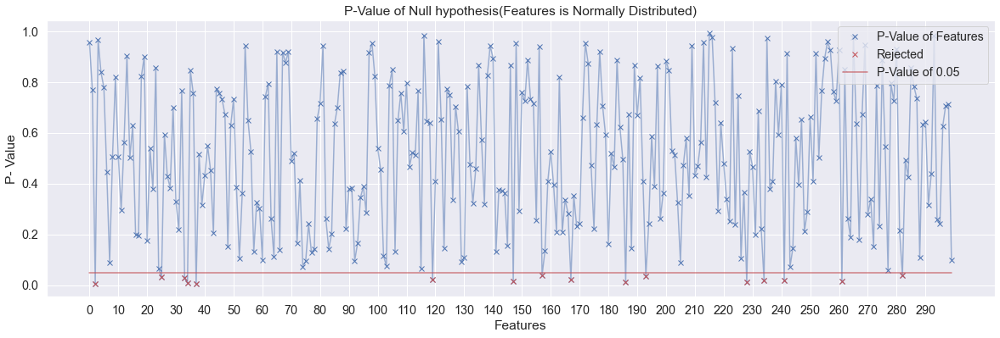

No of Features that are not Normal:  16
No of Features that are likely to be Normal:  284


In [9]:
sns.set(font_scale=1.3)
plt.figure(figsize=(20,6))

plt.plot(desc.loc['normal_hyp_pval'],'xb', label = 'P-Value of Features')
plt.plot(desc.loc['normal_hyp_pval'],'b', alpha = 0.5)

#taking the features that got p-value less that 0.05
rejected  = np.array([[i,p]for i,p in enumerate(desc.loc['normal_hyp_pval']) if p < 0.05])
plt.plot(rejected[:,0], rejected[:,1],'xr', label = 'Rejected')

plt.plot([0.05]*300,'r', label = 'P-Value of 0.05', alpha = 0.7)

plt.title('P-Value of Null hypothesis(Features is Normally Distributed)')
plt.legend(loc = "upper right")
plt.xlabel('Features')
plt.ylabel('P- Value')
plt.xticks(range(0,300,10))
plt.show()

print('No of Features that are not Normal: ',rejected.shape[0])
print('No of Features that are likely to be Normal: ',desc.shape[1] - rejected.shape[0])

Observations:
- We found that 284 feature are likely to be Gaussian Distribution and 16 Features are definitely not Gaussian.

### Finding The Correlation(Pearson Correlation) Of The Features With The Target Feature

In [10]:
#Using Pearson correlation technique to find the correlation
corr_target = df.corr()['target'][2:]

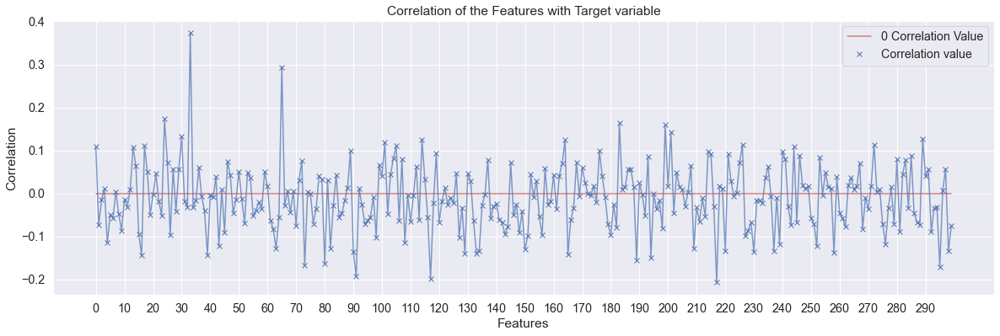

In [11]:
sns.set(font_scale=1.3)
plt.figure(figsize=(20,6))
plt.plot([0]*300,'r', label = '0 Correlation Value', alpha = 0.7)
plt.plot(corr_target,'xb', label = 'Correlation value')
plt.plot(corr_target,'b', alpha = 0.7)
plt.title('Correlation of the Features with Target variable')
plt.legend(loc = "upper right")
plt.xlabel('Features')
plt.ylabel('Correlation')
plt.xticks(range(0,300,10))
plt.show()

Observations:
- Most of the features are not correlated to the target variable and we can see that only some has absolute correlation value higher that 0.1

### Top 20 Highly Correlated Features

In [12]:
#sorting the features based on the absolute correlation value
sorted_corr = corr_target.sort_values(ascending=False, key= lambda x: abs(x))[:20]

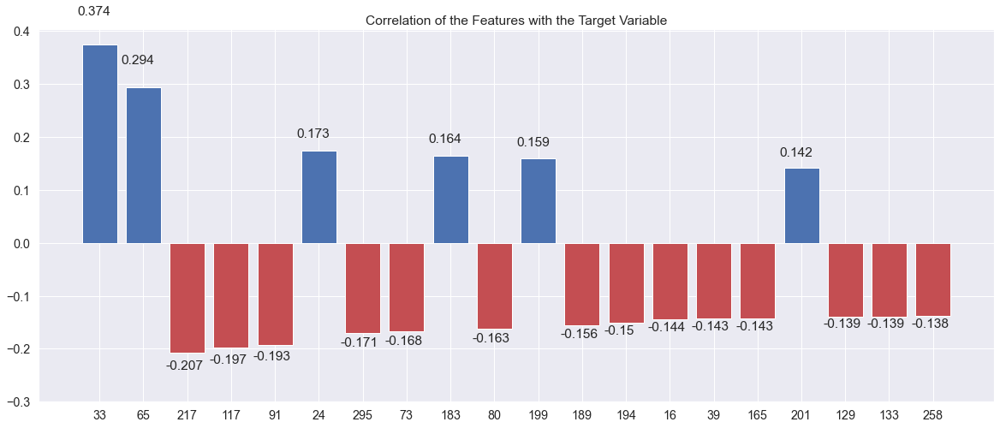

In [13]:
sns.set(font_scale=1.3)
plt.figure(figsize=(20,8))

#finding the positively correlated features to use a diff color code for them
mask = sorted_corr > 0
colors = np.array(['r']*len(sorted_corr))
colors[mask] = 'b'

plt.bar(sorted_corr.index, sorted_corr, color = colors)
plt.yticks(np.arange(-0.3, 0.5, 0.1))
plt.title('Correlation of the Features with the Target Variable')

for i, v in enumerate(sorted_corr.values):
    plt.annotate(round(v,3),xytext=(i-0.5,v*1.15),xy=(i,v))
    
plt.show()

Observations:
- The Highest correlated value is 0.37
- Feature 33, 127, 65, 117, 91 are the most correlated features.These 

### Pair Plot Of The Top 7 Highly Correlated Features

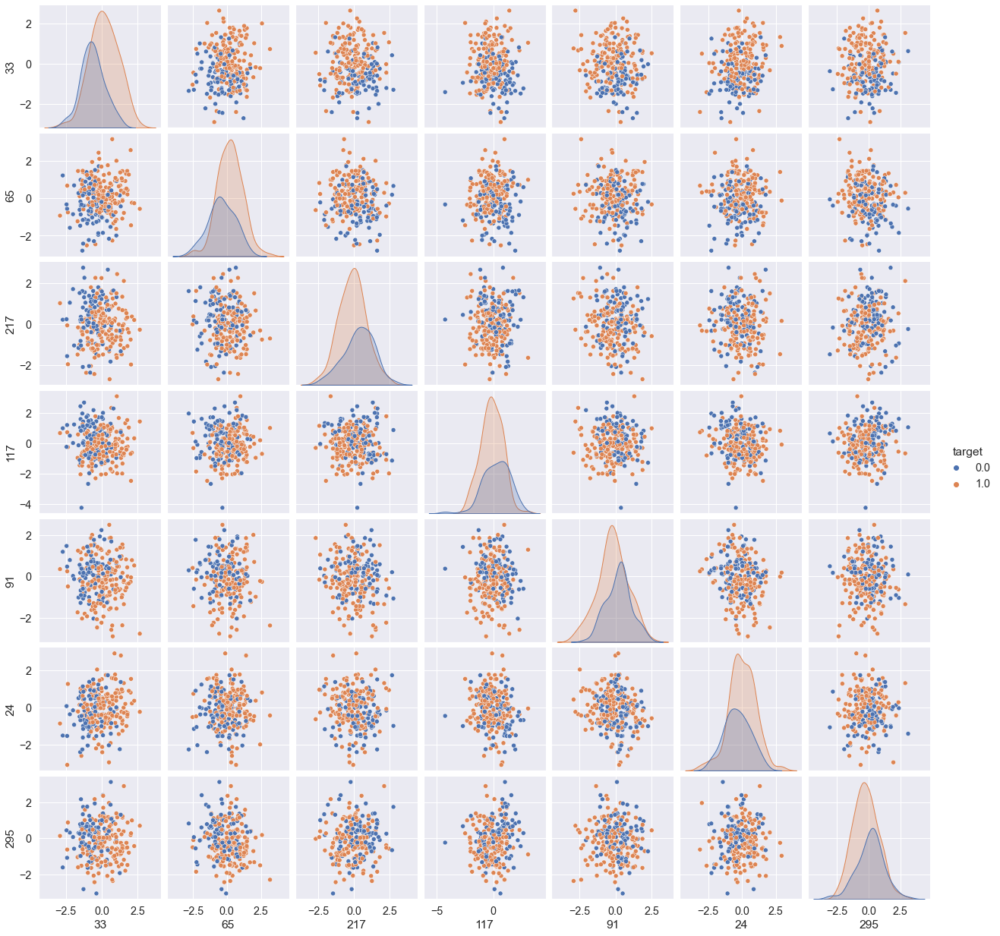

In [14]:
index = [str(i)for i in sorted_corr.index]
sns.set(font_scale=1.3)
sns.pairplot(df[index[:7]+['target']], hue='target')
plt.show()

Observations:
- The pairplot between the highly correlated Features show that the datapoints of both the classes are not entirely overlapped. So these features will have more impact and will help the model to perform better

### Properties Of All The Features

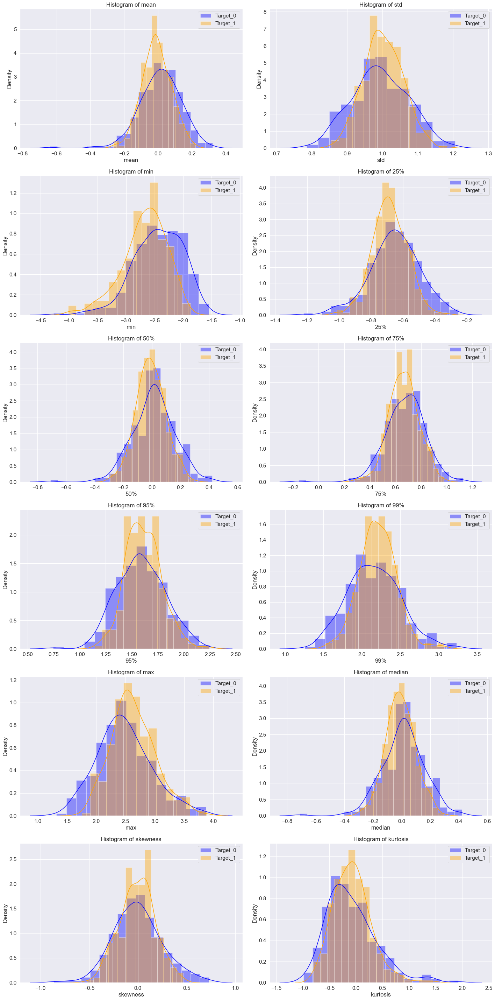

In [15]:
plt.figure(figsize=(20,40))
sns.set(font_scale=1.4)
for i, col in enumerate(desc_0.index[1:-2]):
    plt.subplot(6,2,i+1)
    sns.distplot(desc_0.loc[col], label = 'Target_0 ', color='blue')
    sns.distplot(desc_1.loc[col], label = 'Target_1', color='orange')
    plt.title('Histogram of '+col)
    plt.legend()
plt.tight_layout()
plt.show()

Observations:
- The mean, median and the standard deviation's distribution looks mostly similair but those distributions of features of class 1 are have little bit wider compared to class 0
- The min value of class 0 is greater that the min value of class 1 
- The max value of class 0 is lesser that the max value of class 1
- The 25th, 50th, 75th percentile's distribution also distribution of features of class 1 are have little bit wider compared to class 0
- The distribution of Skewness is similair for both the class and the krutosis distribution shows that the krutosis of class 1 is lower that the class 0

### Multivariate analysis using T-SNE

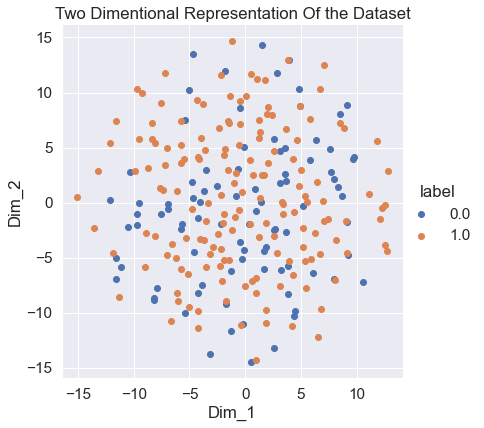

In [16]:
model = TSNE(n_components=2, random_state=0, perplexity=15,  n_iter=10000)

tsne_data = model.fit_transform(df.drop(['id', 'target'], axis = 1))
tsne_data = np.vstack((tsne_data.T, df['target'].T)).T
tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "label"))

sns.FacetGrid(tsne_df, hue="label", size=6).map(plt.scatter, 'Dim_1', 'Dim_2').add_legend()
plt.title('Two Dimentional Representation Of the Dataset')
plt.show()

Observations:
- The lower dimentional representation of the data also shows that data is likely to be mostly overlapped in higher dimension. And there seems to be no seperate clusters or grouping

### Multivariate analysis using PCA

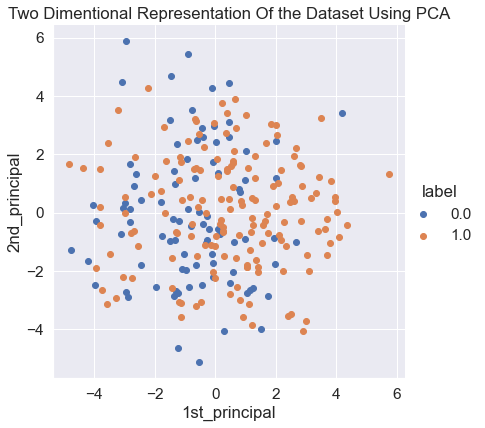

In [17]:
pca = decomposition.PCA()
pca.n_components = 2
pca_data = pca.fit_transform(df.loc[:,'0':])
pca_data = np.vstack((pca_data.T, df[['target']].T)).T

dataframe = pd.DataFrame(data=pca_data, columns=("2nd_principal", "1st_principal", "label"))
sns.set(font_scale=1.4)
sns.FacetGrid(dataframe, hue="label", size=6).map(plt.scatter, '1st_principal', '2nd_principal').add_legend()
plt.title('Two Dimentional Representation Of the Dataset Using PCA')
plt.show()

Observations:
- The data points in the first two principle axis after PCA also seems to overlap. And there appears to be no grouping of data points based on class variable.